In [1]:
from pylab import *
import numpy as np
import time
import matplotlib.pyplot as plt
import skimage
from skimage import color
from skimage import exposure
from skimage import filters
from skimage import io
from skimage import util
from scipy import ndimage


1. Zadatak:

Slika street.tif predstavlja sliku širokog dinamičkog opsega (HDR) gde je svaka koordinata boje predstavljena sa 16 bita. Potrebno je poboljšati kontrast ove slike i sačuvati je u uint8 formatu u izlazni fajl street_out.jpg koji se može prikazati na standardnim displejima. Eksperimentisati sa više različitih metoda i parametara. U okviru izveštaja je potrebno prikazati i prokomentarisati ove rezultate. Na osnovu ove diskusije odabrati najbolje rešenje i tu sliku sačuvati u izlazni fajl.

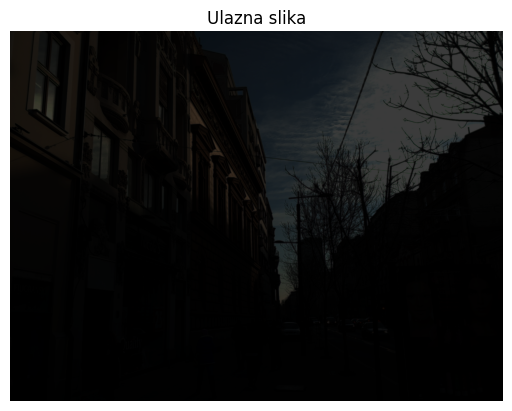

In [41]:
# Ucitavanje slike i prikaz

img = util.img_as_float(io.imread("sekvence/street.tif"));
plt.imshow(img)
plt.axis('off');
plt.title('Ulazna slika');


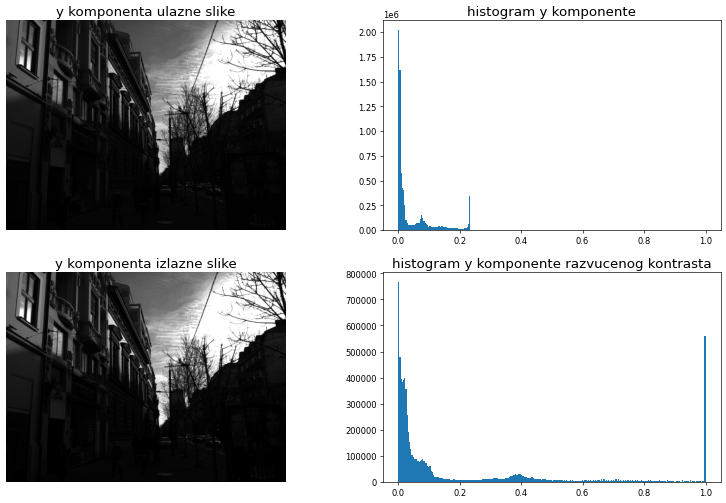

In [42]:
# Razvlacenje kontrasta

# img_yuv - ulazna slika u yuv formatu
# y_in - y komponenta ulazne slike
# y_out - y komponenta slike kojoj je razvučen kontrast
# img_izl - rgb slika kojoj je razvučen kontrast

# Određivanje granica prema kojima radim razvlacenje kontrasta
p2, p93 = np.percentile(img, (2, 93)) # 2% piksela ima manji intezitet od p2, 93% piksela ima manji intenzitet od p93

# Definisanje osa za crtanje
fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(16,10), dpi=60)

#  Konverzija slike u yuv jer se dalja obrada vrši isključivo na y komponenti
img_yuv = color.rgb2yuv(img)
y_in = img_yuv[:,:,0]

# Razvlacenje histograma
y_out = exposure.rescale_intensity(y_in, in_range = (p2, p93), out_range = (0, 1)); 

# Konverzija nazad u rgb

img_izl = img.copy()
img_izl[:,:,0] = img_izl[:,:,0]*y_out/(y_in+1e-6)
img_izl[:,:,1] = img_izl[:,:,1]*y_out/(y_in+1e-6)
img_izl[:,:,2] = img_izl[:,:,2]*y_out/(y_in+1e-6)
img_izl = np.clip(img_izl, 0, 1)

# Definisanje šta se nalazi na kojoj osi
ax[0,0].imshow(y_in,cmap='gray'); ax[0,0].set_axis_off(); ax[0,0].set_title('y komponenta ulazne slike', fontsize=16);
ax[0,1].hist(y_in.flatten(),bins=256,range=(0,1)); ax[0,1].set_title('histogram y komponente', fontsize=16);

ax[1,0].imshow(y_out,cmap='gray'); ax[1,0].set_axis_off(); ax[1,0].set_title('y komponenta izlazne slike', fontsize=16);
ax[1,1].hist(y_out.flatten(),bins=256,range=(0,1)); ax[1,1].set_title('histogram y komponente razvucenog kontrasta', fontsize=16);



Iako je slika visokog dinamičkog opsega, samo razvlačenje kontrasta neće mnogo pomoći jer je veliki broj piksela skoncentrisan oko nule:
U nastavku ću pokušati da popravim kontrast sa tri metode:
1. Adaptivna ekvalizacija histograma sa ograničenjem kontrasta
2. Popravka pomoću logaritamske funkcije
3. Popravka pomoću stepene funkcije

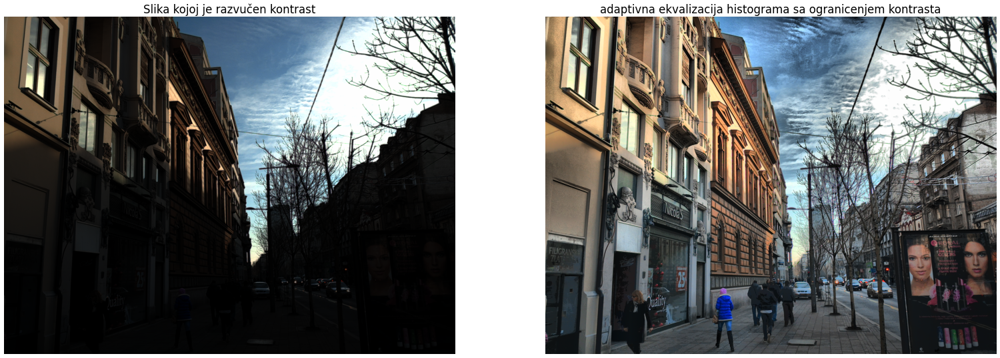

In [43]:
# Adaptivna ekvalizacija histograma sa ograničenjem kontrasta

# y_clahe - y komponenta slike nad kojom je izvršena adaptivna ekvalizacija
# img_adapteq_izl - rgb slika nad kojom je izvršena adaptivna ekvalizacija


fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(32,20), dpi=60)

# Menjanjem parametra clip_limit došao sam do toga da se najbolja slika dobija za 0.06
y_clahe = exposure.equalize_adapthist(y_in,clip_limit=0.06)

# Primena adaptivne ekvalizacije na rgb komponente
img_adapteq_izl = img.copy()
img_adapteq_izl[:,:,0] = img_adapteq_izl[:,:,0]*y_clahe/(y_in+1e-6)
img_adapteq_izl[:,:,1] = img_adapteq_izl[:,:,1]*y_clahe/(y_in+1e-6)
img_adapteq_izl[:,:,2] = img_adapteq_izl[:,:,2]*y_clahe/(y_in+1e-6)
img_adapteq_izl = np.clip(img_adapteq_izl, 0, 1)

ax[0].imshow(img_izl); ax[0].set_axis_off(); ax[0].set_title('Slika kojoj je razvučen kontrast', fontsize=20);
ax[1].imshow(img_adapteq_izl); ax[1].set_axis_off(); ax[1].set_title('adaptivna ekvalizacija histograma sa ogranicenjem kontrasta', fontsize=20);


Iako je ova metoda znatno poboljšala osvetljenost slike, na delovima oblaka gde se prelazi iz tamnije boje(plava) u svetliju(belu) dolazi do pojave halo efekta, pa ova metoda nije najbolje rešenje za datu sliku

In [44]:
# Transformacija logaritamskom funkcijom

def log_transform(f, c):
    # Opis funkcije

    # f - slika koja se obrađuje
    # c - konstanta koja utice na nagib logaritamske funkcije, 
    # što je ona veća funkcija brže raste ka jedinici ipiksele koji su koncentirsani oko nule će preslikati u veći opseg na izlazu

    g = log(1 + (10**c)*f)/log(1+10**c) #delimo sa log da bismo vratili u opseg 0 do 1
    return g

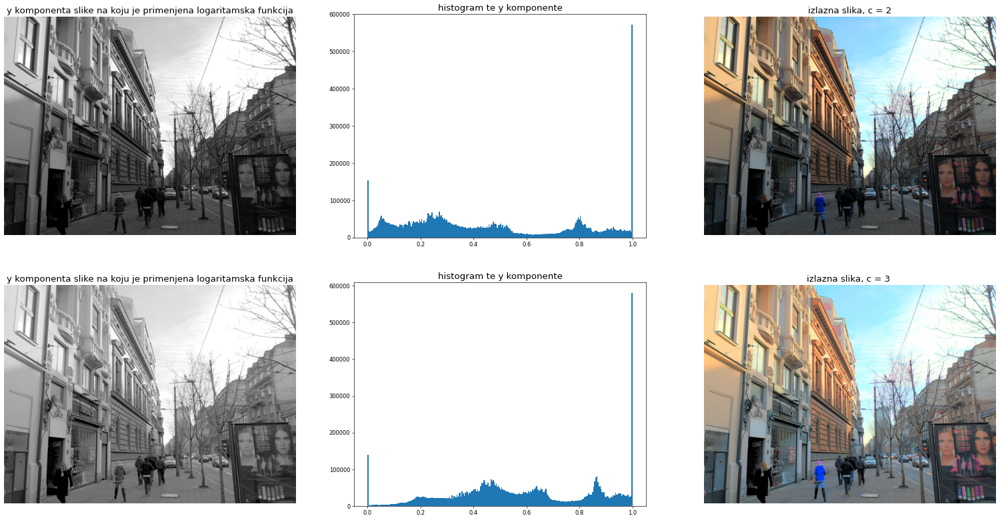

In [45]:
# Konstante koje ulaze u logaritamsku funkciju
c1 = 2
c2 = 3

# Transformacija y komponente slike nad kojom je izvršeno razvlačenje kontrasta sa dve različite konstante
img_y_log1 = log_transform(y_out,c1)
img_y_log1 = np.clip(img_y_log1, 0, 1)
img_y_log2 = log_transform(y_out,c2)
img_y_log2 = np.clip(img_y_log2, 0, 1)
fig, ax = plt.subplots(nrows=2, ncols=3, figsize=(32,16), dpi=60)

# Primena log funkcije na rgb komponente
img_izl_log1 = img.copy()
img_izl_log1[:,:,0] = img_izl_log1[:,:,0]*img_y_log1/(y_in+1e-6)
img_izl_log1[:,:,1] = img_izl_log1[:,:,1]*img_y_log1/(y_in+1e-6)
img_izl_log1[:,:,2] = img_izl_log1[:,:,2]*img_y_log1/(y_in+1e-6)
img_izl_log1 = np.clip(img_izl_log1, 0, 1)

img_izl_log2 = img.copy()
img_izl_log2[:,:,0] = img_izl_log2[:,:,0]*img_y_log2/(y_in+1e-6)
img_izl_log2[:,:,1] = img_izl_log2[:,:,1]*img_y_log2/(y_in+1e-6)
img_izl_log2[:,:,2] = img_izl_log2[:,:,2]*img_y_log2/(y_in+1e-6)
img_izl_log2 = np.clip(img_izl_log2, 0, 1)

# Prikaz dobijenih rezultata
ax[0,0].imshow(img_y_log1,cmap='gray'); ax[0,0].set_axis_off(); ax[0,0].set_title('y komponenta slike na koju je primenjena logaritamska funkcija', fontsize=16);
ax[0,1].hist(img_y_log1.flatten(),bins=256,range=(0,1)); ax[0,1].set_title('histogram te y komponente', fontsize=16);
ax[0,2].imshow(img_izl_log1); ax[0,2].set_title('izlazna slika, c = {}'.format(c1), fontsize=16); ax[0,2].set_axis_off();

ax[1,0].imshow(img_y_log2,cmap='gray'); ax[1,0].set_axis_off(); ax[1,0].set_title('y komponenta slike na koju je primenjena logaritamska funkcija', fontsize=16);
ax[1,1].hist(img_y_log2.flatten(),bins=256,range=(0,1)); ax[1,1].set_title('histogram te y komponente', fontsize=16);
ax[1,2].imshow(img_izl_log2); ax[1,2].set_title('izlazna slika, c = {} '.format(c2), fontsize=16); ax[1,2].set_axis_off();


Obe konstante daju dobre rezultate, s tim što je slika koja se dobija pomoću c=3 previše svetla u nekim regionima zbog znatno bržeg rasta logaritamske funkcije

In [46]:
def gamma_transform(f, c=0.5):

    # Opis funkcije
    # f - Slika koja se obrađuje
    # c - kontanta koja utiče na to da li će slika postati svelija ili tamnija:
    # ukoliko je 0<c<1 funkcija će preslikavati intenzitete blizu nule u širi opseg, tj. tamna slika će postati svetlija
    # ukoliko je c>>1 funkcija će preslikavati intenzitete blizu jedinice u širi opseg, tj. svetla slika će postati taminja
    g = f**c
    return g

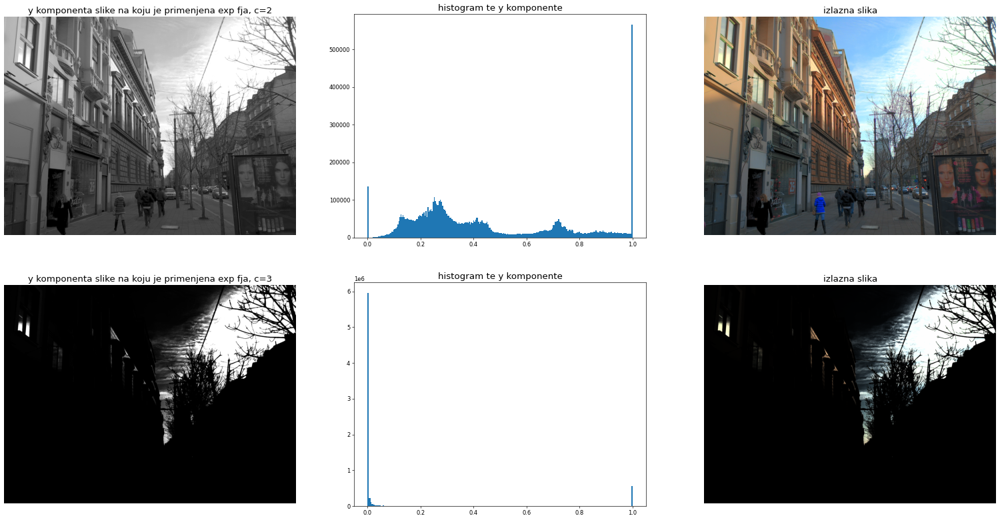

In [47]:
# Transformacija stepenom funkcijom
img_y_exp1 = gamma_transform(y_out,0.35)
img_y_exp2 = gamma_transform(y_out,5)

fig, ax = plt.subplots(nrows=2, ncols=3, figsize=(32,16), dpi=60)

# Primena eksponencijalne funkcije na rgb komponente slike
img_izl_exp1 = img.copy()
img_izl_exp1[:,:,0] = img_izl_exp1[:,:,0]*img_y_exp1/(y_in+1e-6)
img_izl_exp1[:,:,1] = img_izl_exp1[:,:,1]*img_y_exp1/(y_in+1e-6)
img_izl_exp1[:,:,2] = img_izl_exp1[:,:,2]*img_y_exp1/(y_in+1e-6)
img_izl_exp1 = np.clip(img_izl_exp1, 0, 1)

img_izl_exp2 = img.copy()
img_izl_exp2[:,:,0] = img_izl_exp2[:,:,0]*img_y_exp2/(y_in+1e-6)
img_izl_exp2[:,:,1] = img_izl_exp2[:,:,1]*img_y_exp2/(y_in+1e-6)
img_izl_exp2[:,:,2] = img_izl_exp2[:,:,2]*img_y_exp2/(y_in+1e-6)
img_izl_exp2 = np.clip(img_izl_exp2, 0, 1)

ax[0,0].imshow(img_y_exp1,cmap='gray'); ax[0,0].set_axis_off(); ax[0,0].set_title('y komponenta slike na koju je primenjena exp fja, c={}'.format(c1), fontsize=16)
ax[0,1].hist(img_y_exp1.flatten(),bins=256,range=(0,1)); ax[0,1].set_title('histogram te y komponente', fontsize=16)
ax[0,2].imshow(img_izl_exp1); ax[0,2].set_title('izlazna slika', fontsize=16); ax[0,2].set_axis_off();

ax[1,0].imshow(img_y_exp2,cmap='gray'); ax[1,0].set_axis_off(); ax[1,0].set_title('y komponenta slike na koju je primenjena exp fja, c={}'.format(c2), fontsize=16)
ax[1,1].hist(img_y_exp2.flatten(),bins=256,range=(0,1)); ax[1,1].set_title('histogram te y komponente', fontsize=16)
ax[1,2].imshow(img_izl_exp2); ax[1,2].set_title('izlazna slika', fontsize=16); ax[1,2].set_axis_off();



Sa parametrom c>1 dobiće se još tamnija slika od početne, jer je veliki broj piksela već bio taman, a još jedan broj piksela koji su bili svetli se dodatno preslikao u tamne piksele. Od prezentovanih metoda najbolje izgleda popravka logaritamskom funkcjom sa c=2 pa tu sliku biram kao rešenje.

In [48]:
img_end = img_izl_exp1*255
img_end = img_end.astype('uint8')
io.imsave('sekvence/street_out.jpg',img_end);

2. Zadatak
Izoštriti sliku miner.jpg. Voditi računa o da se u postupku izoštravanja šum ne pojača previše i da detalji ne postanu suviše neprirodni i prenaglašeni (vidi primer). U izveštaju objasniti korišćenu metodu i odabrane parametre. U izveštaju je takođe potrebno prikazati i prokomentarisati dobijene rezultate. Potrebno je generisati izlaznu sliku u boji korišćenjem YUV kolor sistema i izoštravanjem sive slike osvetljaja. Sačuvati izlaznu sliku u fajl miner_sharp.jpg.

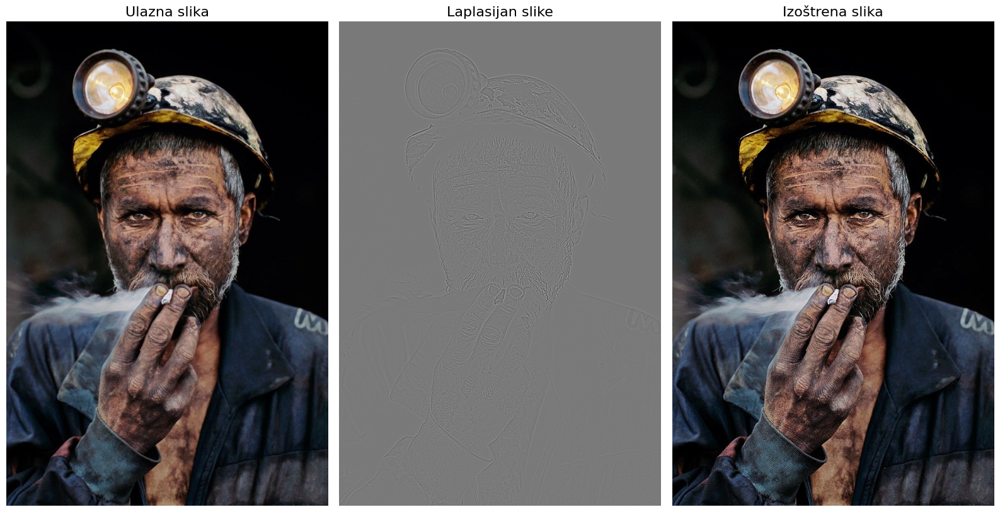

In [49]:

#Laplasijan izostravanje 

# img - ulazna slika
# img_yuv - slika konvertovana u yuv format
# laplacian_mask - Laplasijan maska koja predstavlja gradijent funkcije
# img_y_in -  y komponenta ulazne slike
# img_lap_y - Laplasijan maska primenjena na y komponentu
# 
# Korelacijom y komponente i laplasijan maske dobijamo gradijent promene i dodavanjem/oduzimanjem te promene na početnu sliku 
# izoštravaju se ivice
# pomnožio sam detalje koeficijentom 0.2 da ivice ne bi postale preterano izražene

#Ucitavanje slike i prebacivanje u yuv format
img = util.img_as_float(io.imread('sekvence/miner.jpg'))
img_yuv = color.rgb2yuv(img)
img_y_in = img_yuv[:,:,0];

# Pravljenje maske i izostravanje slike
laplacian_mask = np.array([ [1,  1, 1],
                            [1, -8, 1],
                            [1,  1, 1] ])
img_lap_y = ndimage.correlate(img_y_in, laplacian_mask)

img_y_in - 0.2*img_lap_y
img_sharp_y = img_y_in - 0.2*img_lap_y
img_lap_y +=abs(min(img_lap_y.flatten()))


# Izoštravanje svih komponenti rgb slike 
img_rbg_sharp  =img.copy() 
img_rbg_sharp[:,:,0] = img_rbg_sharp[:,:,0]*(img_sharp_y)/(img_y_in+1e-6)
img_rbg_sharp[:,:,1] = img_rbg_sharp[:,:,1]*(img_sharp_y)/(img_y_in+1e-6)
img_rbg_sharp[:,:,2] = img_rbg_sharp[:,:,2]*(img_sharp_y)/(img_y_in+1e-6)
img_rbg_sharp = np.clip(img_rbg_sharp, 0, 1)


fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(16,8), dpi=100)
ax = axes.ravel()

ax[0].imshow(img); ax[0].set_axis_off(); ax[0].set_title('Ulazna slika', fontsize=16)
ax[1].imshow(img_lap_y,cmap='gray'); ax[1].set_axis_off(); ax[1].set_title('Laplasijan slike', fontsize=16)
ax[2].imshow(img_rbg_sharp, vmin=0, vmax=1); ax[2].set_axis_off(); ax[2].set_title('Izoštrena slika', fontsize=16)

plt.tight_layout();


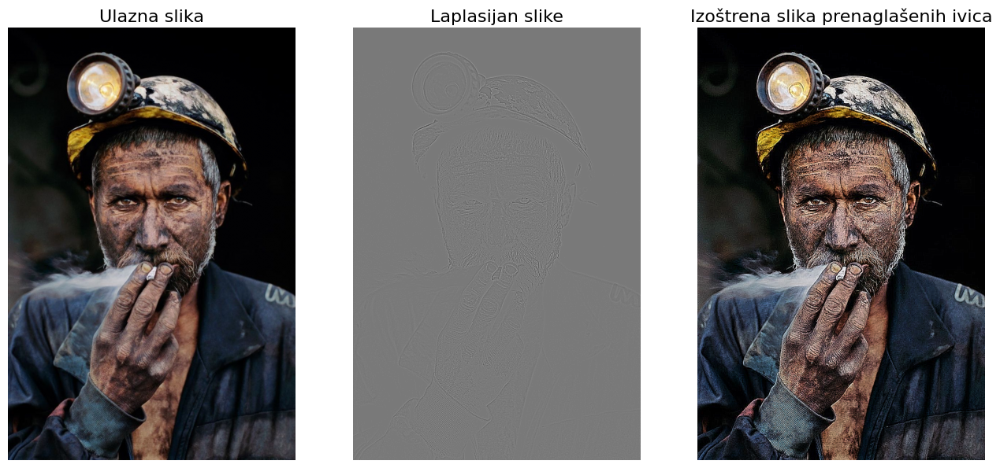

In [50]:
# Prenaglašavanje ivica

img_lap_y = ndimage.correlate(img_y_in, laplacian_mask)
img_sharp_prenaglasena = img_y_in - img_lap_y
img_rbg_prenaglasena  =img.copy() 
img_rbg_prenaglasena[:,:,0] = img_rbg_prenaglasena[:,:,0]*(img_sharp_prenaglasena)/(img_y_in+1e-6)
img_rbg_prenaglasena[:,:,1] = img_rbg_prenaglasena[:,:,1]*(img_sharp_prenaglasena)/(img_y_in+1e-6)
img_rbg_prenaglasena[:,:,2] = img_rbg_prenaglasena[:,:,2]*(img_sharp_prenaglasena)/(img_y_in+1e-6)
img_rbg_prenaglasena = np.clip(img_rbg_prenaglasena, 0, 1)


fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(16,8), dpi=100)
ax = axes.ravel()

ax[0].imshow(img); ax[0].set_axis_off(); ax[0].set_title('Ulazna slika', fontsize=16);
ax[1].imshow(img_lap_y,cmap='gray'); ax[1].set_axis_off(); ax[1].set_title('Laplasijan slike', fontsize=16);
ax[2].imshow(img_rbg_prenaglasena, vmin=0, vmax=1); ax[2].set_axis_off(); ax[2].set_title('Izoštrena slika prenaglašenih ivica', fontsize=16);


Izostravanje pomocu isticanja visokih ucestanosti

Pomoću ove metode početnu sliku zamućujemo, pa od početne slike oduzimamo tu zamućenu i tako izdvajamo detalje,pa se potom detalji vraćaju na početnu sliku sa određenim koeficijentom. Sa ovom metodom potrebno je biti oprezan jer se zajedno sa detaljima
izdvaja i šum koji se potom dodaje na sliku, pa se ukupan šum povećava

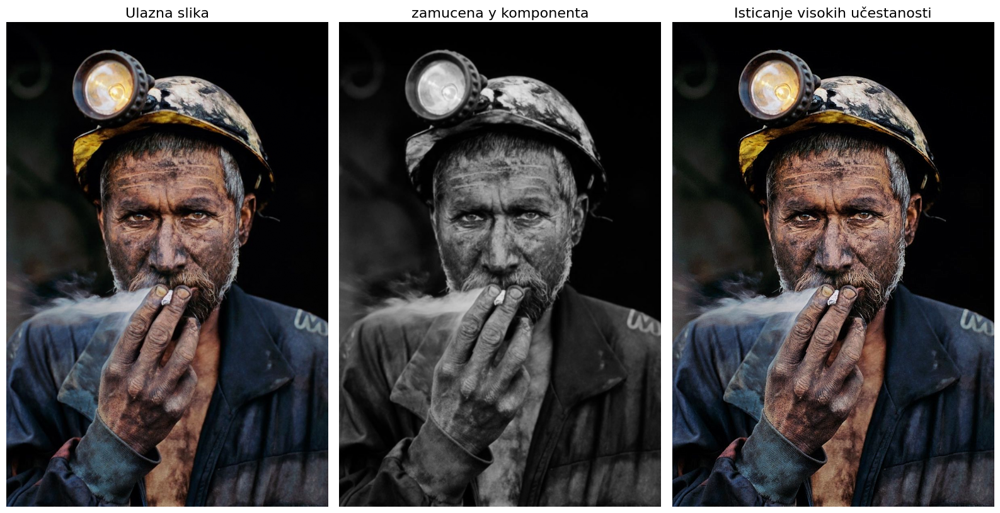

In [51]:

# lopass_mask - maska pomoću koje se zamućuje slika
# img_blurred - zamućena slika
# izoštrena slika


# Kreiranje maske i izostravanje
lowpass_mask = np.ones(shape=(3,3))/9
img_blurred = ndimage.correlate(img_y_in, lowpass_mask)

img_details = img_y_in - img_blurred # Zamucena slika se oduzima od pocentne cime se izdvajaju detalji
img_sharp_y1 = img_y_in + 1.5*img_details # Dodavanje detalja na pocetnu sliku

# Izoštravanje svake komponente rgb slike
img_rbg_sharp1  =img.copy() 
img_rbg_sharp1[:,:,0] = img_rbg_sharp1[:,:,0]*(img_sharp_y1)/(img_y_in+1e-6)
img_rbg_sharp1[:,:,1] = img_rbg_sharp1[:,:,1]*(img_sharp_y1)/(img_y_in+1e-6)
img_rbg_sharp1[:,:,2] = img_rbg_sharp1[:,:,2]*(img_sharp_y1)/(img_y_in+1e-6)
img_rbg_sharp1 = np.clip(img_rbg_sharp1, 0, 1)


fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(16,8), dpi=100)
ax = axes.ravel()

ax[0].imshow(img, vmin=0, vmax=1); ax[0].set_axis_off(); ax[0].set_title('Ulazna slika', fontsize=16)
ax[1].imshow(img_blurred,cmap = 'gray', vmin=0, vmax=1); ax[1].set_axis_off(); ax[1].set_title('zamucena y komponenta', fontsize=16)
ax[2].imshow(img_rbg_sharp1, vmin=0, vmax=1); ax[2].set_axis_off(); ax[2].set_title('Isticanje visokih učestanosti', fontsize=16)

plt.tight_layout()
plt.show()

Obe metode daju zadovoljavajuće rezultate,pa biram da sačuvam laplasijana.

In [52]:
uint_slika = 255*img_rbg_sharp1
uint_slika = uint_slika.astype('uint8')
io.imsave('sekvence/miner_sharp.jpg.jpg',uint_slika);

3. Zadatak:
Realizovati funkciju dosCLAHE koja realizuje adaptivnu ekvalizaciju histograma uz ograničenje kontrasta. Parametri funkcije su ulazna slika koja se obrađuje, niz od 2 elementa koji sadrži broj blokova po vertikali i horizontali i maksimalna vrednost po jednom elementu histograma.

In [3]:
def dosCLAHE(imgIn=1, numTiles=[8,8], limit=0.01):
    
    # Opis funkcije
    #
    # Funkcija kao parametre prima sliku koja se obrađuje, broj blokova po vertikali i horizontali na koliko se slika deli, i limit kontrasta.
    # Najpre se određuje da li se radi sa slikom u boji ili crno-belom slikom,pa se nalazi potreban broj piksela koje je potrebno dodati
    # na sliku da bi broj piksela po horizontali i vertikali bio deljiv sa brojem blokov. Potom se slika deli na potreban broj 
    # blokova i za svaki blok se računa njegov histogram koji se zatim ograničava zadatim limitom.
    # 
    # Napomena: Funkcija je realizovana tako da se višak od limitiranja uniformno raspoređuje na sve vrednosti pa će određeni inenziteti 
    # koji su bili na granici dobiti veću vrednost nego što je zadati limit. Iz toga sledi da bi funkcija mogla da odradi posao za 
    # zadati limit=0 što je praktično nemoguće, pa je potrebno eksplicitno dodati uslov da se limit postavlja na 1 ukoliko se zada 0,
    # tj. u tom slučaju ne raditi ograničenje kontrasta.
    # 
    # Iz histograma koji su ograničeni se potom izračunava kumulativna funkcija raspodele svakog bloka,koje u nastavku
    # služe za ekvalizaciju histograma
    # 
    # U iteracijama koje slede, svaki broj se deli na kvadrante, jer se u zavisnosti od kvadranta u kom se nalazi piksel određuju najbliži 
    # blokovi
    #
    # Intenzitet svakog piksela se preslikava u određene kumulativne funkcije četiri najbliža bloka(3 komšijska i sopstveni blok) i potom se
    # te vrednosti množe sa koefijentima koji predsavljaju rastojanja trenutnog piksela od centara blokova koji se koriste,po horizontali i
    # vertikali
    # 

    if(limit==0): # iz napomene
        limit = 1
    if(limit<0 or limit>1):
        print("Limit mora biti između nula i 1")
        return
    
    redovi = numTiles[0]
    kolone = numTiles[1]
    hist = np.zeros((1,256))

    # Razdvajanje slucajeva da li je slika u boji ili crno-bela

    if size(shape(imgIn))==2:

        # Dodavanje određenog broja piksela sa srane i odozdo, analogno se radi i sa slikom u boji
        imgUl = copy(imgIn)
        redovi_dodatni = redovi - shape(imgUl)[0] % redovi 
        kolone_dodatne = kolone - shape(imgUl)[1] % kolone
        imgUl = np.pad(imgUl,[(0,redovi_dodatni),(0,kolone_dodatne)],mode = 'reflect')
        visina_bloka = shape(imgUl)[0]/redovi
        sirina_bloka = shape(imgUl)[1]/kolone

    elif size(shape(imgIn))==3:
        imgUl = copy(imgIn)
        redovi_dodatni = redovi - shape(img)[0] % redovi
        kolone_dodatne = kolone - shape(img)[1] % kolone
        imgyuv = color.rgb2yuv(imgUl)
        imgUl1 = imgyuv[:,:,0]
        imgUl = np.pad(imgUl1,[(0,redovi_dodatni),(0,kolone_dodatne)],mode = 'reflect')
        visina_bloka = shape(imgUl)[0]/redovi
        sirina_bloka = shape(imgUl)[1]/kolone

    histogrami = zeros((1,redovi*kolone))
    kum_fje = np.zeros((redovi*kolone,256))

    for i in range(0,redovi):
        for j in range(0,kolone):

# Pocetak i kraj svakog bloka po x y koordinatama
            x_start = int((shape(imgUl)[0]/redovi*i))
            x_end = int((shape(imgUl)[0]/redovi*(i+1)-1))
            y_start = int((shape(imgUl)[1]/kolone*j))
            y_end = int((shape(imgUl)[1]/kolone*(j+1)-1))

# Podela slike na blokove

            blok1 = imgUl[x_start:x_end+1,y_start:y_end+1]
            blok = blok1.flatten()
            

# Racunanje histograma za svaki blok
            histogram = zeros((1,256))
            for k in range(0,len(blok)):
                histogram[0,int(round(blok[k]))] += 1/len(blok)
            visak = 0
# Ogranicenje kontrasta na histogramu svakog bloka

            for k in range(0,256):
                if histogram[0,k]>limit:
                    visak += histogram[0,k]-limit
                    histogram[0,k] = limit
            visak/= 256
            for k in range(0,256):
                histogram[0,k]+=visak
            

# Racunanje kumulativne funkcije raspodele za svaki blok
           # kum_fja = zeros((1,256))
           # for k in range(0,len(histogram[0])):
           #     for l in range(0,k):
           #        kum_fja[0,k]+=histogram[0,l]
            kum_fje[i*kolone+j] = np.cumsum(histogram) # ukoliko nije dozvoljeno korišćenje ove funkcije kod iznad radi istu stvar
            

# Kumulativne funkcije svih blokova se nalaze u listi a blokovi su indeksirani s leva na desno odozgo na dole

    img_clahe = imgUl.copy()
    for i in range(0,shape(imgUl)[0]):
        for j in range(0,shape(imgUl)[1]):

# Iteriranje po svim blokovima i pronalazenje koordinate centara svakog bloka
            x_koord_bloka = visina_bloka*floor(i/visina_bloka)//visina_bloka
            y_koord_bloka = sirina_bloka*floor(j/sirina_bloka)//sirina_bloka

            blok = int(x_koord_bloka*kolone+y_koord_bloka) # Pronalazenje odgovarajuceg indeksa bloka zbog pristupa kumulativnim funkcijama
            xc = visina_bloka*floor(i/visina_bloka)+(visina_bloka-1)/2
            yc = sirina_bloka*floor(j/sirina_bloka)+(sirina_bloka-1)/2


            # definisanje razdaljina a,b, c d
            # a - rastojanje trenutnog piksela od centra bloka kome taj piksel pripada po y osi
            # b - rastojanje trenutnog piksela od centra najblizeg susednog bloka po y osi
            # d - rastojanje trenutnog piksela od centra bloka kome taj piksel pripada po x osi
            # c - rastojanje trenutnog piksela od centra najblizeg susednog bloka po x osi

            # bilinearna interpolacija- opisana na početku funkcije
            
            if(i-xc>=0 and j-yc>=0):                                                     # Nalazimo se u donjem desnom kvadrantu bloka
                b = sirina_bloka-j+yc
                a = j-yc
                d = i-xc
                c = visina_bloka-i+xc
                intenzitet = int(round(imgUl[i,j]))
                if(yc+sirina_bloka>shape(imgUl)[1] and xc+visina_bloka>shape(imgUl)[0]): # Ivicni slucaj kada smo u donjem desnom cosku slike
                    s = kum_fje[blok][intenzitet]
                elif(yc+sirina_bloka>shape(imgUl)[1]):                                   # Ivicni slucaj kada smo na desnoj ivici slike
                    sh1 = kum_fje[blok][intenzitet]
                    sh2 = kum_fje[blok+kolone][intenzitet]
                    s = (d*sh2+c*sh1)/(c+d)
                elif(xc+visina_bloka>shape(imgUl)[0]):                                   # Ivicni slucaj kada smo na donjoj ivici slike
                    s = (b*kum_fje[blok][intenzitet]+a*kum_fje[blok+1][intenzitet])/(a+b)
                else:
                    sh1 = (b*kum_fje[blok][intenzitet]+a*kum_fje[blok+1][intenzitet])/(a+b)
                    sh2 = (b*kum_fje[blok+kolone][intenzitet]+a*kum_fje[blok+kolone+1][intenzitet])/(a+b)
                    s = (d*sh2+c*sh1)/(c+d)
                img_clahe[i,j] = s

            elif(i-xc>=0 and j-yc<0):                                                   # Nalazimo se u donjem levom kvadrantu bloka
                b = sirina_bloka+j-yc
                a = yc-j
                d = i-xc
                c = visina_bloka-i+xc
                intenzitet = int(round(imgUl[i,j]))
                if (yc-sirina_bloka<0 and xc+visina_bloka>shape(imgUl)[0]):            # Ivicni slucaj kada smo u donjem levom cosku slike
                    s = kum_fje[blok][intenzitet]

                elif (yc-sirina_bloka<0):                                              # Ivicni slucaj kada smo na levoj ivici slike
                    sh1 = kum_fje[blok][intenzitet]
                    sh2 = kum_fje[blok+kolone][intenzitet]
                    s = (d*sh2+c*sh1)/(c+d)

                elif(xc+visina_bloka>shape(imgUl)[0]):                                 # Ivicni slucaj kada smo na donjoj ivici slike
                    s = (b*kum_fje[blok][intenzitet]+a*kum_fje[blok-1][intenzitet])/(a+b) 

                else:
                    sh1 = (b*kum_fje[blok][intenzitet]+a*kum_fje[blok-1][intenzitet])/(a+b)
                    sh2 = (b*kum_fje[blok+kolone][intenzitet]+a*kum_fje[blok+kolone-1][intenzitet])/(a+b)
                    s = (d*sh2+c*sh1)/(c+d)
                img_clahe[i,j] = s
                
            elif(i-xc<0 and j-yc>=0):                                                   # Nalazimo se u gornjem desnom kvadrantu bloka
               
                b = sirina_bloka-j+yc
                a = j-yc
                d = xc-i
                c = visina_bloka+i-xc
                intenzitet = int(round(imgUl[i,j]))

                if(yc+sirina_bloka>shape(imgUl[1]) and xc-visina_bloka<0):              # Ivicni slucaj kada smo u gornjem desnom cosku slike
                     s = kum_fje[blok][intenzitet]
                
                elif(yc+sirina_bloka>shape(imgUl[1])):                                  # Ivicni slucaj kada smo na desnoj ivici slike
                    sh1 = kum_fje[blok][intenzitet]
                    sh2 = kum_fje[blok-kolone][intenzitet]
                    s = (d*sh2+c*sh1)/(c+d)
                
                elif(xc-visina_bloka<0):                                                # Ivicni slucaj kada smo na gornjoj ivici slike
                    s = (b*kum_fje[blok][intenzitet]+a*kum_fje[blok+1][intenzitet])/(a+b) 
                
                else:
                    sh1 = (b*kum_fje[blok][intenzitet]+a*kum_fje[blok+1][intenzitet])/(a+b) 
                    sh2 = (b*kum_fje[blok-kolone][intenzitet]+a*kum_fje[blok-kolone+1][intenzitet])/(a+b)
                    s = (d*sh2+c*sh1)/(c+d)
                
                img_clahe[i,j] = s
            
            elif(i-xc<0 and j-yc<0):                                                   # Nalazimo se u gornjem levom kvadrantu bloka
                b = sirina_bloka+j-yc
                a = yc-j
                d = xc-i
                c = visina_bloka+i-xc
                intenzitet = int(round(imgUl[i,j]))
                
                if(yc-sirina_bloka<0 and xc-visina_bloka<0):                           # Ivicni slucaj kada smo u gornjem levom cosku slike
                    s = kum_fje[blok][intenzitet]
                
                elif(yc-sirina_bloka<0):                                               # Ivicni slucaj kada smo na levoj ivici slike
                    sh1 = kum_fje[blok][intenzitet]
                    sh2 = kum_fje[blok-kolone][intenzitet]
                    s = (d*sh2+c*sh1)/(c+d)
                
                elif(xc-visina_bloka<0):                                               # Ivicni slucaj kada smo na gornjoj ivici slike
                    s = (b*kum_fje[blok][intenzitet]+a*kum_fje[blok-1][intenzitet])/(a+b) 
                
                else:
                    sh1 = (b*kum_fje[blok][intenzitet]+a*kum_fje[blok-1][intenzitet])/(a+b)
                    sh2 = (b*kum_fje[blok-kolone][intenzitet]+a*kum_fje[blok-kolone-1][intenzitet])/(a+b)
                    s = (d*sh2+c*sh1)/(c+d)
                img_clahe[i,j] = s

    if( size(shape(imgIn))==3):
        img_clahe = img_clahe[0:shape(img_clahe)[0]-redovi_dodatni,0:shape(img_clahe)[1]-kolone_dodatne]
        imgIzl = imgIn.copy()
        
        # CLAHE se radi nad svakom komponentom rgb slike
        imgIzl[:,:,0] = imgIzl[:,:,0]*(img_clahe/(imgUl1+1e-6)) 
        imgIzl[:,:,1] = imgIzl[:,:,1]*(img_clahe/(imgUl1+1e-6))
        imgIzl[:,:,2] = imgIzl[:,:,2]*(img_clahe/(imgUl1+1e-6))
        imgIzl = np.clip(imgIzl, 0, 1)

    else:
        img_clahe = img_clahe[0:shape(img_clahe)[0]-redovi_dodatni,0:shape(img_clahe)[1]-kolone_dodatne]
        imgIzl = img_clahe
        imgIzl = np.clip(imgIzl, 0, 1)
    return imgIzl




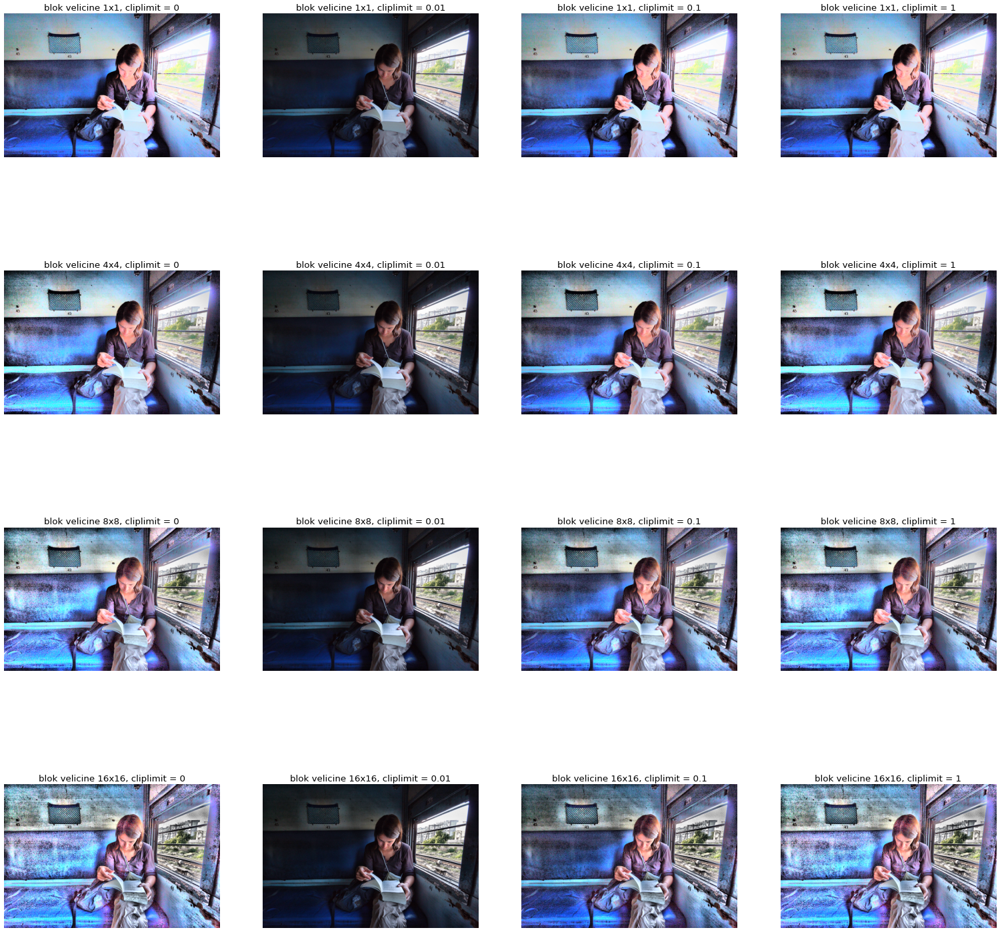

In [54]:
# Ukoliko funkcija primi parametar limit=0 odradice isti posao kao ugradjena funkcija t. nece ograniciti kontrast
img = util.img_as_float(io.imread('sekvence/train.jpg'))*255
clip_limits = [0,0.01,0.1,1]
fig, ax = plt.subplots(nrows=4, ncols=4, figsize=(32,32), dpi=60)
lista_vremena = []

# Testiranje i iscrtavanje funkcije za parametre cliplimit = [0,0.01,0.1,1] i broj blokova po obe dimenzije [1,4,8,16]
for i in range(0,4):
    for j in range(0,4):
        if(i==0):
            start = time.time()
            img_clahe = dosCLAHE(img,[1,1],clip_limits[j])
            end = time.time()
            if(j==2):
                lista_vremena.append(end-start)
            ax[i,j].imshow(img_clahe); 
            ax[i,j].set_axis_off(); 
            ax[i,j].set_title("blok velicine {}x{}, cliplimit = {}".format(1,1,clip_limits[j]), fontsize=16)
            
        elif (i==3):
            start = time.time()
            img_clahe = dosCLAHE(img,[16,16],clip_limits[j])
            end = time.time()
            if(j==2):
                lista_vremena.append(end-start)
            ax[i,j].imshow(img_clahe); 
            ax[i,j].set_axis_off(); 
            ax[i,j].set_title("blok velicine {}x{}, cliplimit = {}".format(16,16,clip_limits[j]), fontsize=16)
        else:
            start = time.time()
            img_clahe = dosCLAHE(img,[i*4,i*4],clip_limits[j])
            end = time.time()
            if(j==2):
                lista_vremena.append(end-start)
            ax[i,j].imshow(img_clahe); 
            ax[i,j].set_axis_off(); 
            ax[i,j].set_title("blok velicine {}x{}, cliplimit = {}".format(i*4,i*4,clip_limits[j]), fontsize=16)

Ukoliko se slika ne deli na blokove, već se radi sa celom slikom dobija se isti rezultat kao da nije rađena adaptivna ekvalizacija,svetli delovi ostaju svetli, jer histogram cele slike nije dovoljan da se poprave lokalizovani svetli regioni. Sa velikim brojem blokova dolazi do pojave halo efekta zbog lokalizacije susednih blokova i dobija se obrnut slučaj nego kada ima samo jedan blok.Ukoliko je određen blok taman, a pored njega blok svetao,iz histograma prvog bloka se ne može ništa zaključiti od susednom bloku i obrnuto, pa između svetlih i tamnih regiona dolazi do naglog prelaza i clahe ne može to da kompenzuje.

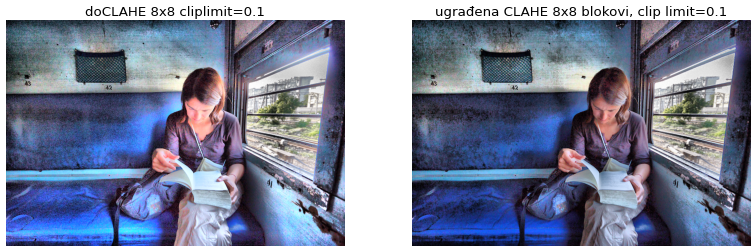

In [4]:
# Poredjenje dosCLAHE i ugradjene funkcije za cliplimit=0.1 i 8 blokova po obe dimenzije
img = util.img_as_float(io.imread('sekvence/train.jpg'))*255
[height,width,boje] = shape(img)
vremena_ugradjene = []
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(16,8), dpi=60)
slika = dosCLAHE(img,[10,7],0.1)
ax[0].imshow(slika); 
ax[0].set_axis_off(); 
ax[0].set_title("doCLAHE 8x8 cliplimit=0.1", fontsize=16)
for i in range(0,4):
    if(i==0):
        start = time.time()
        slika_clahe = exposure.equalize_adapthist(img/255,kernel_size=[height,width],clip_limit = 0.1)
        end = time.time()
    else:
        start = time.time()
        slika_clahe = exposure.equalize_adapthist(img/255,kernel_size=[height/(2**(i+1)),width/(2**(i+1))],clip_limit = 0.1)
        end = time.time()
        if(i==2):
            ax[1].imshow(slika_clahe); 
            ax[1].set_axis_off(); 
            ax[1].set_title("ugrađena CLAHE 8x8 blokovi, clip limit=0.1", fontsize=16)
    vremena_ugradjene.append(end-start)


Upoređivanjem dosCLAHE i ugrađene funkcije vidi se da je na određenim regionima slika svetlija sa dosCLAHE, a to se može objasniti načinom realizacije funkcije,iako je zadat cliplimit 0.1 pravo ograničenje je otišlo preko te vrednosti,pa je to izmenilo kumulativne funkcije i dalji tok obrade.

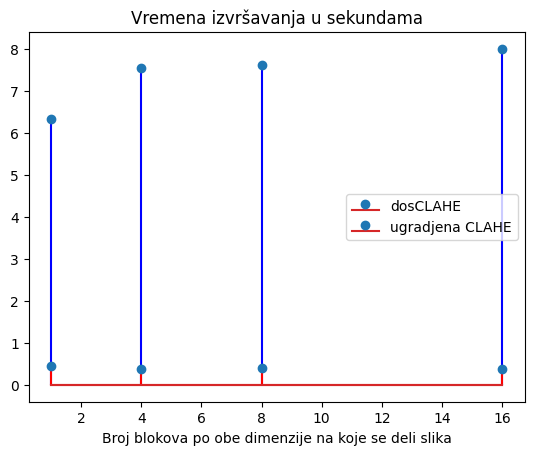

In [56]:
blokovi = [1,4,8,16]
plt.stem(blokovi,lista_vremena,linefmt = 'blue',label='dosCLAHE')
plt.stem(blokovi,vremena_ugradjene,linefmt='red',label='ugradjena CLAHE')
plt.xlabel('Broj blokova po obe dimenzije na koje se deli slika')
plt.legend()
plt.title('Vremena izvršavanja u sekundama');



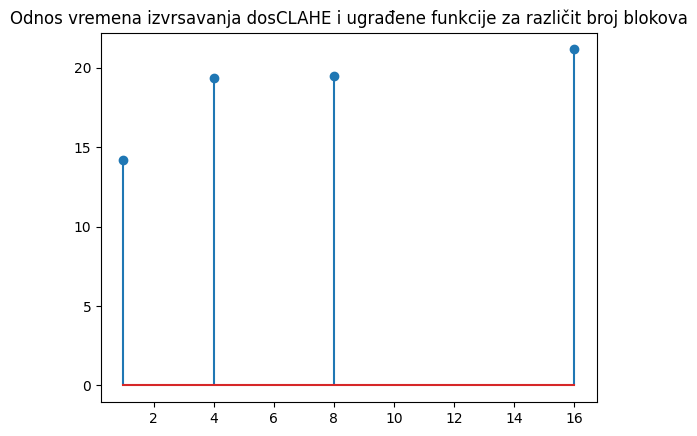

In [57]:
odnos = []
for i in range(0,4):
    odnos.append(lista_vremena[i]/vremena_ugradjene[i])

plt.stem(blokovi,odnos,label='dosCLAHE')
plt.title('Odnos vremena izvrsavanja dosCLAHE i ugrađene funkcije za različit broj blokova');